# 🌸 Flower Recognition: DNN, CNN & Transfer Learning

**Dataset:** [Flowers Recognition](https://www.kaggle.com/datasets/alxmamaev/flowers-recognition) — 5 classes: Daisy, Dandelion, Rose, Sunflower, Tulip

---

## 📋 Table of Contents

1. [Setup & Imports](#1-setup)
2. [Dataset Download & Exploration](#2-eda)
3. [Data Preprocessing](#3-preprocessing)
4. [Data Splitting](#4-splitting)
5. [Model 1 — Deep Neural Network (DNN)](#5-dnn)
6. [Model 2 — Convolutional Neural Network (CNN)](#6-cnn)
7. [Bonus — Transfer Learning (MobileNetV2)](#7-transfer)
8. [Model Comparison](#8-comparison)

---

<a id="1-setup"></a>
## 1. Setup & Imports

Install and import all required libraries. We fix random seeds for reproducibility.

In [1]:
#!pip install -q kaggle tensorflow scikit-learn matplotlib seaborn opencv-python tqdm pillow

In [2]:

import os
import random
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from tqdm import tqdm
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (confusion_matrix, classification_report,
                             ConfusionMatrixDisplay)
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Dense, Flatten, Dropout, BatchNormalization, Activation,
    Conv2D, MaxPooling2D, GlobalAveragePooling2D, Input
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print(f'TensorFlow version : {tf.__version__}')
print(f'GPUs available     : {tf.config.list_physical_devices("GPU")}')

TensorFlow version : 2.21.0
GPUs available     : []


<a id="2-eda"></a>
## 2. Dataset Download & Exploratory Data Analysis

We use the **Flowers Recognition** dataset from Kaggle (`alxmamaev/flowers-recognition`).  
It contains **5 flower classes**: Daisy, Dandelion, Rose, Sunflower, Tulip.


In [3]:

DATA_DIR = './flowers'          
CLASSES  = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
IMG_SIZE = 128                     

print('Dataset directory:', DATA_DIR)
print('Classes          :', CLASSES)

Dataset directory: ./flowers
Classes          : ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


In [4]:

counts = {}
for cls in CLASSES:
    path = os.path.join(DATA_DIR, cls)
    files = [f for f in os.listdir(path)
             if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    counts[cls] = len(files)

count_df = pd.DataFrame(list(counts.items()), columns=['Flower', 'Count'])
print(count_df.to_string(index=False))
print(f'\nTotal images: {count_df.Count.sum()}')

   Flower  Count
    daisy    764
dandelion    774
     rose    784
sunflower    733
    tulip    769

Total images: 3824


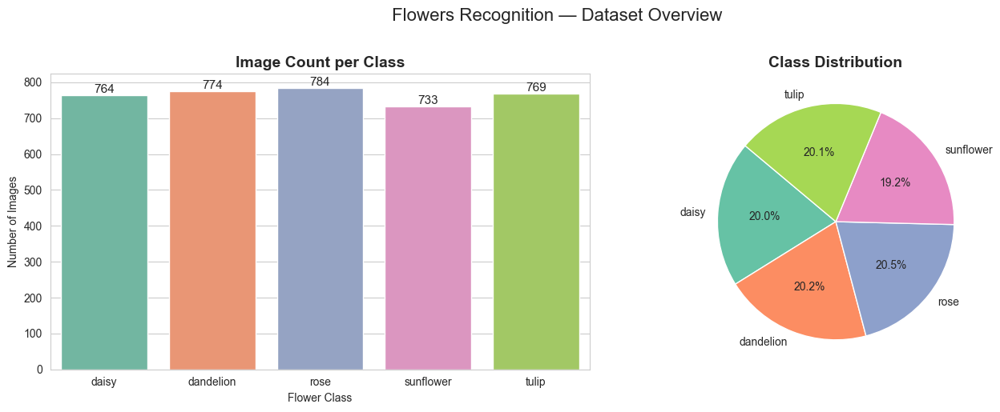

In [5]:
# ── Class-distribution bar chart ──────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

palette = sns.color_palette('Set2', len(CLASSES))

# Bar chart
sns.barplot(data=count_df, x='Flower', y='Count', palette=palette, ax=axes[0])
axes[0].set_title('Image Count per Class', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Flower Class')
axes[0].set_ylabel('Number of Images')
for p in axes[0].patches:
    axes[0].annotate(f'{int(p.get_height())}',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='bottom', fontsize=11)

# Pie chart
axes[1].pie(count_df.Count, labels=count_df.Flower,
            autopct='%1.1f%%', colors=palette,
            startangle=140, wedgeprops={'edgecolor': 'white'})
axes[1].set_title('Class Distribution', fontsize=14, fontweight='bold')

plt.suptitle('Flowers Recognition — Dataset Overview', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

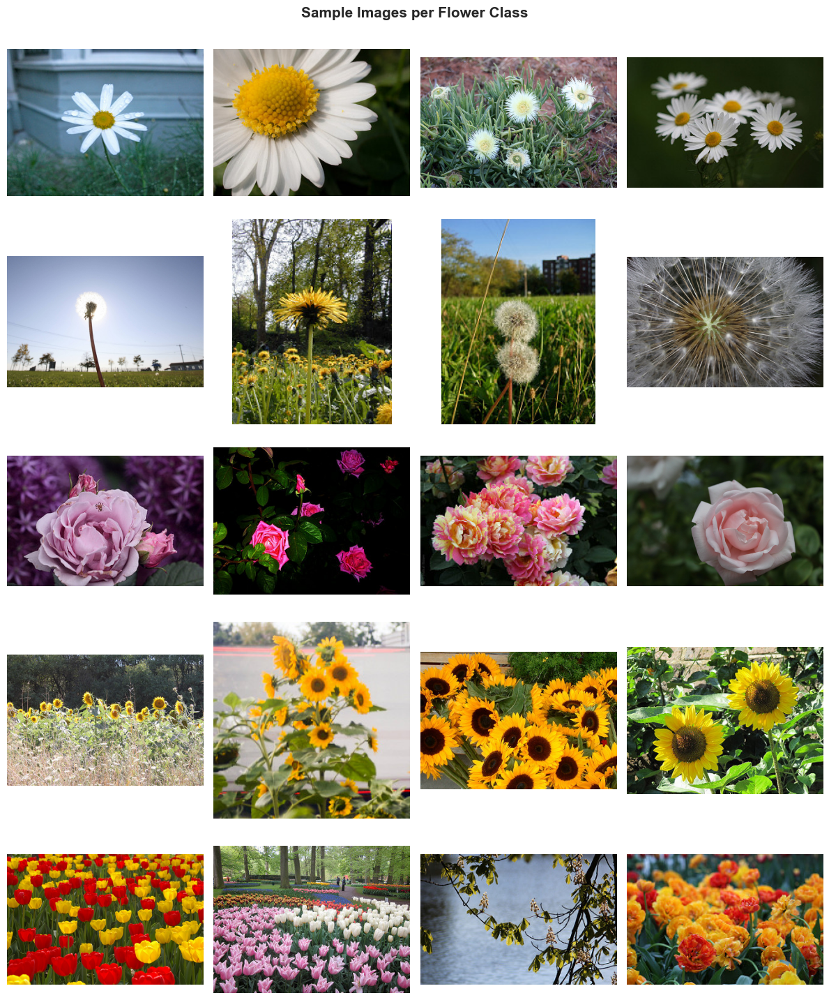

In [6]:
SAMPLES_PER_CLASS = 4

fig, axes = plt.subplots(len(CLASSES), SAMPLES_PER_CLASS,
                          figsize=(SAMPLES_PER_CLASS * 3, len(CLASSES) * 3))

for row, cls in enumerate(CLASSES):
    cls_dir   = os.path.join(DATA_DIR, cls)
    all_imgs  = [f for f in os.listdir(cls_dir)
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    chosen    = random.sample(all_imgs, SAMPLES_PER_CLASS)

    for col, fname in enumerate(chosen):
        img = cv2.imread(os.path.join(cls_dir, fname))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(cls.capitalize(), fontsize=12,
                                       fontweight='bold', rotation=0,
                                       labelpad=60)

plt.suptitle('Sample Images per Flower Class', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

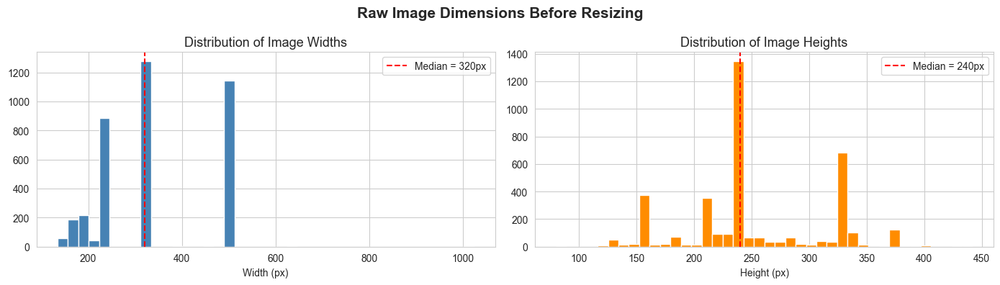

Width  — min:   134  max:  1024  mean: 337
Height — min:    80  max:   442  mean: 253


In [7]:
widths, heights = [], []
for cls in CLASSES:
    cls_dir = os.path.join(DATA_DIR, cls)
    for fname in os.listdir(cls_dir):
        if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        try:
            with Image.open(os.path.join(cls_dir, fname)) as im:
                w, h = im.size
                widths.append(w)
                heights.append(h)
        except Exception:
            pass

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].hist(widths,  bins=40, color='steelblue',  edgecolor='white')
axes[0].set_title('Distribution of Image Widths',  fontsize=13)
axes[0].set_xlabel('Width (px)')
axes[0].axvline(np.median(widths), color='red', linestyle='--',
                label=f'Median = {int(np.median(widths))}px')
axes[0].legend()

axes[1].hist(heights, bins=40, color='darkorange', edgecolor='white')
axes[1].set_title('Distribution of Image Heights', fontsize=13)
axes[1].set_xlabel('Height (px)')
axes[1].axvline(np.median(heights), color='red', linestyle='--',
                label=f'Median = {int(np.median(heights))}px')
axes[1].legend()

plt.suptitle('Raw Image Dimensions Before Resizing', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()
print(f'Width  — min: {min(widths):5d}  max: {max(widths):5d}  mean: {np.mean(widths):.0f}')
print(f'Height — min: {min(heights):5d}  max: {max(heights):5d}  mean: {np.mean(heights):.0f}')

<a id="3-preprocessing"></a>
## 3. Data Preprocessing

Steps:
- Resize all images to **128 × 128** pixels
- Convert BGR → RGB (OpenCV default is BGR)
- Normalize pixel values to **[0, 1]**
- Label-encode class names, then one-hot encode targets

In [ ]:
X_raw, y_raw = [], []

for cls in CLASSES:
    #CLASSES  = ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
    cls_dir = os.path.join(DATA_DIR, cls)
    #  بكريت فولدر لكل نوع ورد واحطه في الفايل الكبير
    #DATA_DIR = './flowers'  
    files   = [f for f in os.listdir(cls_dir)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    #بجيب كل صورة في كل فولدر واتأكد ان صيغتها مظبوطة

    for fname in tqdm(files, desc=f'Loading {cls:<10}'):
        #بعمل البار بتاع التحميل اللي في الاوتبوت 
        fpath = os.path.join(cls_dir, fname)
        #بجيب الباث بتاع كل صورة لوحدها
        img   = cv2.imread(fpath, cv2.IMREAD_COLOR)
        #بحط كل صورة في الفاريبل اميدج
        if img is None:
            continue                 
        #اتأكد ان فيه صورة                     
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        #بحول الصورة من بي جي ار ل ار جي بي       
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))     
        #بعمل ريسايز للصورة 
        X_raw.append(img)
        #بحط الصورة في جدول
        y_raw.append(cls)
        #بحط معاها الكلاس بتاعها

X = np.array(X_raw, dtype='float32') / 255.0
#بعمل نورمالزيشن للصورة
print(f'\nX shape : {X.shape}   dtype : {X.dtype}')
print(f'Pixel range: [{X.min():.2f}, {X.max():.2f}]')

Loading tulip     : 100%|██████████| 769/769 [00:02<00:00, 371.36it/s]



X shape : (3824, 128, 128, 3)   dtype : float32
Pixel range: [0.00, 1.00]


In [ ]:
le      = LabelEncoder()
#بعمل لكل كلاس اي دي معين
y_enc   = le.fit_transform(y_raw)     
#بيطبق الليبول انكودينج على الداتا       
y_ohe   = to_categorical(y_enc, num_classes=len(CLASSES))  
#بيعمل ون هوت انكودينج

print('Classes (encoded order):', le.classes_)
print('y_enc  shape:', y_enc.shape)
print('y_ohe  shape:', y_ohe.shape)

Classes (encoded order): ['daisy' 'dandelion' 'rose' 'sunflower' 'tulip']
y_enc  shape: (3824,)
y_ohe  shape: (3824, 5)


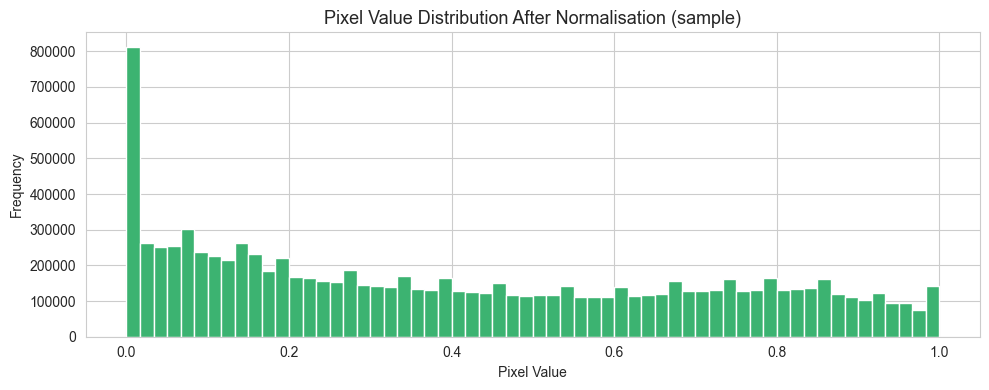

In [ ]:
fig, ax = plt.subplots(figsize=(10, 4))
#بعمل انيشيزليزيشن للبلوت
sample_pixels = X[:200].flatten()  
#خد اول متين صورة بس
ax.hist(sample_pixels, bins=60, color='mediumseagreen', edgecolor='white')
#رسملت لهم هستوجرام
ax.set_title('Pixel Value Distribution After Normalisation (sample)', fontsize=13)
#حط تايتل للبلوت 
ax.set_xlabel('Pixel Value')
#حط تايتل للاكس
ax.set_ylabel('Frequency')
#حط تايتل للواي

plt.tight_layout()
plt.show()

<a id="4-splitting"></a>
## 4. Data Splitting

We split the dataset into **three** non-overlapping sets:

| Split      | Fraction | Purpose                           |
|------------|----------|-----------------------------------|
| Training   | 70 %     | Model fitting                     |
| Validation | 15 %     | Hyperparameter tuning / callbacks  |
| Test       | 15 %     | Final unbiased evaluation          |

In [11]:
X_train, X_temp, y_train, y_temp, y_train_enc, y_temp_enc = train_test_split(
    X, y_ohe, y_enc, test_size=0.30, random_state=SEED, stratify=y_enc)

X_val, X_test, y_val, y_test, y_val_enc, y_test_enc = train_test_split(
    X_temp, y_temp, y_temp_enc, test_size=0.50, random_state=SEED, stratify=y_temp_enc)

print(f'Training   : {X_train.shape[0]:5d} images  →  {X_train.shape}')
print(f'Validation : {X_val.shape[0]:5d} images  →  {X_val.shape}')
print(f'Test       : {X_test.shape[0]:5d} images  →  {X_test.shape}')

Training   :  2676 images  →  (2676, 128, 128, 3)
Validation :   574 images  →  (574, 128, 128, 3)
Test       :   574 images  →  (574, 128, 128, 3)


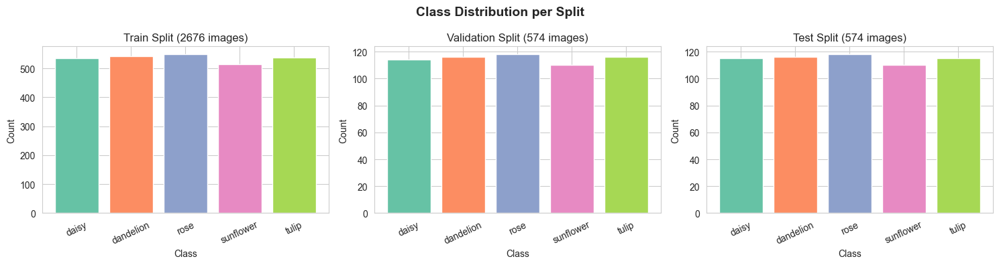

In [12]:
split_names  = ['Train', 'Validation', 'Test']
split_labels = [y_train_enc, y_val_enc, y_test_enc]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, name, labels in zip(axes, split_names, split_labels):
    unique, cnts = np.unique(labels, return_counts=True)
    ax.bar(le.classes_, cnts, color=sns.color_palette('Set2', len(CLASSES)))
    ax.set_title(f'{name} Split ({len(labels)} images)', fontsize=12)
    ax.set_xlabel('Class')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=25)

plt.suptitle('Class Distribution per Split', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

---
<a id="5-dnn"></a>
## 5. Model 1 — Deep Neural Network (DNN / ANN)

A fully-connected DNN that takes **flattened** pixel vectors as input.  
Architecture: `Flatten → Dense(512) → BN → Dropout → Dense(256) → BN → Dropout → Softmax(5)`

### Callbacks used
| Callback | Purpose |
|---|---|
| `EarlyStopping` | Stop when val_loss stops improving |
| `ReduceLROnPlateau` | Halve LR when val_loss plateaus |
| `ModelCheckpoint` | Save best model weights |

In [13]:
def build_dnn(input_shape, num_classes):
    model = Sequential([
        Flatten(input_shape=input_shape),

        Dense(512),
        BatchNormalization(),
        Activation('relu'),
        Dropout(0.4),

        Dense(256),
        BatchNormalization(),
        Activation('relu'),
        Dropout(0.3),

        Dense(128, activation='relu'),
        Dropout(0.2),

        Dense(num_classes, activation='softmax')
    ], name='DNN')
    return model

dnn = build_dnn((IMG_SIZE, IMG_SIZE, 3), len(CLASSES))
dnn.compile(optimizer=Adam(learning_rate=1e-3),
            loss='categorical_crossentropy',
            metrics=['accuracy'])
dnn.summary()

Model: "DNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 49152)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    25,166,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,334,277 (96.64 MB)

 Trainable params: 25,332,741 (96.64 MB)

 Non-trainable params: 1,536 (6.00 KB)

In [14]:
os.makedirs('checkpoints', exist_ok=True)

dnn_callbacks = [
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True,
                  verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4,
                      min_lr=1e-6, verbose=1),
    ModelCheckpoint('checkpoints/dnn_best.keras', monitor='val_accuracy',
                    save_best_only=True, verbose=0)
]

dnn_history = dnn.fit(
    X_train, y_train,
    epochs           = 60,
    batch_size       = 64,
    validation_data  = (X_val, y_val),
    callbacks        = dnn_callbacks,
    verbose          = 1
)

Epoch 1/60
42/42 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.3378 - loss: 1.5649 - val_accuracy: 0.3362 - val_loss: 2.1910 - learning_rate: 0.0010
Epoch 2/60
42/42 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.4458 - loss: 1.2943 - val_accuracy: 0.3955 - val_loss: 1.3302 - learning_rate: 0.0010
Epoch 3/60
42/42 ━━━━━━━━━━━━━━━━━━━━ 38s 850ms/step - accuracy: 0.4824 - loss: 1.2322 - val_accuracy: 0.4129 - val_loss: 1.3092 - learning_rate: 0.0010
Epoch 4/60
42/42 ━━━━━━━━━━━━━━━━━━━━ 36s 821ms/step - accuracy: 0.5146 - loss: 1.1567 - val_accuracy: 0.4181 - val_loss: 1.2941 - learning_rate: 0.0010
Epoch 5/60
42/42 ━━━━━━━━━━━━━━━━━━━━ 28s 618ms/step - accuracy: 0.5452 - loss: 1.0854 - val_accuracy: 0.4164 - val_loss: 1.2797 - learning_rate: 0.0010
Epoch 6/60
42/42 ━━━━━━━━━━━━━━━━━━━━ 23s 526ms/step - accuracy: 0.5774 - loss: 1.0219 - val_accuracy: 0.4146 - val_loss: 1.3038 - learning_rate: 0.0010
Epoch 7/60
42/42 ━━━━━━━━━━━━━━━━━━━━ 19s 430ms/step - accuracy: 0.6200 - loss: 0.9366 -

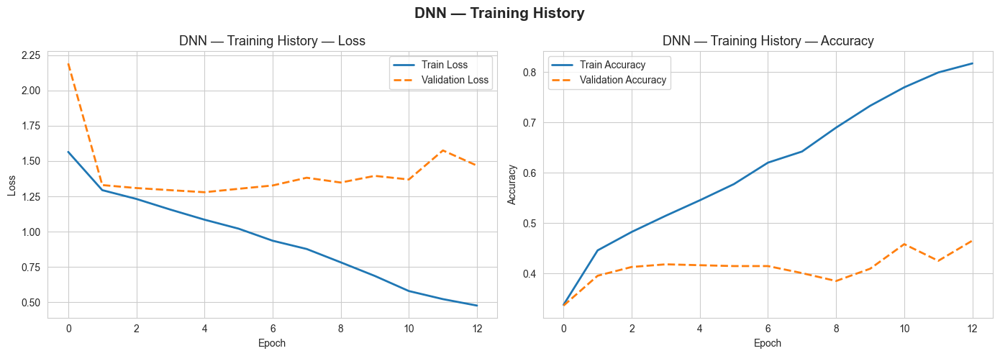

In [15]:
def plot_history(history, title=''):
    """Plot loss and accuracy curves side-by-side."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))


    axes[0].plot(history.history['loss'],     label='Train Loss',      lw=2)
    axes[0].plot(history.history['val_loss'], label='Validation Loss', lw=2,
                 linestyle='--')
    axes[0].set_title(f'{title} — Loss', fontsize=13)
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
    axes[0].legend()

    
    axes[1].plot(history.history['accuracy'],     label='Train Accuracy',      lw=2)
    axes[1].plot(history.history['val_accuracy'], label='Validation Accuracy', lw=2,
                 linestyle='--')
    axes[1].set_title(f'{title} — Accuracy', fontsize=13)
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
    axes[1].legend()

    plt.suptitle(title, fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_history(dnn_history, title='DNN — Training History')

### 5.1 DNN — Evaluation on Test Set

In [16]:
dnn_test_loss, dnn_test_acc = dnn.evaluate(X_test, y_test, verbose=0)
print(f'DNN — Test Loss    : {dnn_test_loss:.4f}')
print(f'DNN — Test Accuracy: {dnn_test_acc:.4f}')

dnn_preds     = dnn.predict(X_test)
dnn_pred_enc  = np.argmax(dnn_preds, axis=1)

print('\n── Classification Report ──────────────────────────────────────────────')
print(classification_report(y_test_enc, dnn_pred_enc,
                             target_names=le.classes_))

DNN — Test Loss    : 1.3093
DNN — Test Accuracy: 0.4530
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step

── Classification Report ──────────────────────────────────────────────
              precision    recall  f1-score   support

       daisy       0.45      0.44      0.45       115
   dandelion       0.37      0.51      0.43       116
        rose       0.44      0.59      0.51       118
   sunflower       0.68      0.50      0.58       110
       tulip       0.40      0.22      0.28       115

    accuracy                           0.45       574
   macro avg       0.47      0.45      0.45       574
weighted avg       0.47      0.45      0.45       574



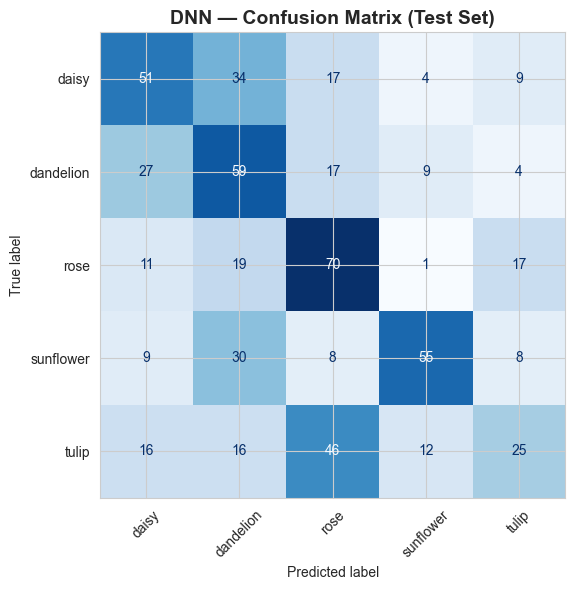

In [17]:
def plot_confusion_matrix(y_true, y_pred, class_names, title='Confusion Matrix'):
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=class_names)
    disp.plot(ax=ax, cmap='Blues', colorbar=False, xticks_rotation=45)
    ax.set_title(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(y_test_enc, dnn_pred_enc, le.classes_,
                      title='DNN — Confusion Matrix (Test Set)')

### 5.2 DNN — Prediction Samples

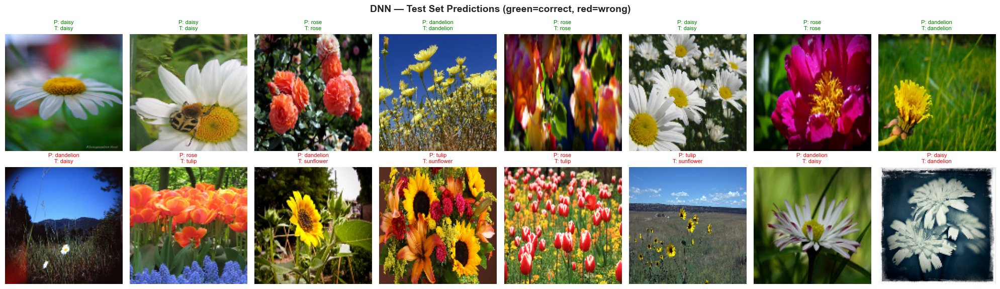

In [18]:
def show_predictions(X_data, y_true_enc, y_pred_enc, le, n=8, title=''):
    """Display n correct and n incorrect predictions."""
    correct   = np.where(y_true_enc == y_pred_enc)[0]
    incorrect = np.where(y_true_enc != y_pred_enc)[0]
    n_show    = min(n, len(correct), len(incorrect))

    fig, axes = plt.subplots(2, n_show, figsize=(n_show * 2.5, 6))
    for col in range(n_show):
        for row, (indices, row_title) in enumerate(
                [(correct, 'Correct'), (incorrect, 'Incorrect')]):
            idx = indices[col]
            axes[row, col].imshow(X_data[idx])
            axes[row, col].axis('off')
            pred  = le.classes_[y_pred_enc[idx]]
            truth = le.classes_[y_true_enc[idx]]
            color = 'green' if pred == truth else 'red'
            axes[row, col].set_title(f'P: {pred}\nT: {truth}',
                                      fontsize=8, color=color)
        axes[row, 0].set_ylabel(row_title, fontsize=11)

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

show_predictions(X_test, y_test_enc, dnn_pred_enc, le,
                 title='DNN — Test Set Predictions (green=correct, red=wrong)')

---
<a id="6-cnn"></a>
## 6. Model 2 — Convolutional Neural Network (CNN)

CNNs are designed for image data: they exploit **spatial locality** and **translation invariance** via convolutional filters.  
We also add **data augmentation** (via `ImageDataGenerator`) to reduce overfitting.

Architecture:  
`Conv→BN→Pool → Conv→BN→Pool → Conv→BN→Pool → Conv→BN→Pool → Flatten → Dense → Dropout → Softmax`

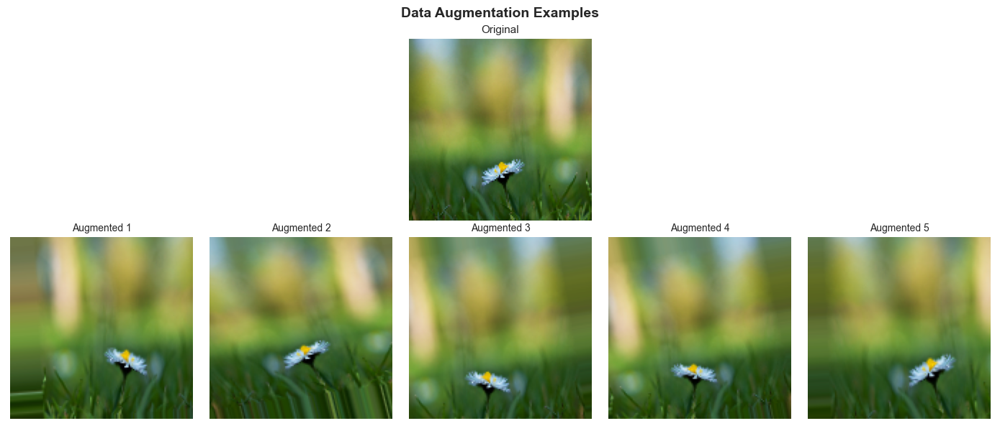

In [19]:
datagen = ImageDataGenerator(
    rotation_range      = 15,
    width_shift_range   = 0.15,
    height_shift_range  = 0.15,
    zoom_range          = 0.15,
    horizontal_flip     = True,
    fill_mode           = 'nearest'
)
datagen.fit(X_train)

sample_img = X_train[np.where(y_train_enc == 0)[0][0]][np.newaxis, ...]  # one daisy
aug_iter   = datagen.flow(sample_img, batch_size=1)

fig, axes = plt.subplots(2, 5, figsize=(14, 6))
axes[0, 2].imshow(sample_img[0])
axes[0, 2].set_title('Original', fontsize=11)
[ax.axis('off') for ax in axes[0]]

for col in range(5):
    aug = next(aug_iter)[0]
    axes[1, col].imshow(np.clip(aug, 0, 1))
    axes[1, col].set_title(f'Augmented {col+1}', fontsize=10)
    axes[1, col].axis('off')

plt.suptitle('Data Augmentation Examples', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [20]:
def build_cnn(input_shape, num_classes):
    model = Sequential(name='CNN')


    model.add(Conv2D(32, (3, 3), padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.25))

   
    model.add(Conv2D(64, (3, 3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.25))

    
    model.add(Conv2D(128, (3, 3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.25))

  
    model.add(Conv2D(256, (3, 3), padding='same'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.25))

  
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax'))

    return model

cnn = build_cnn((IMG_SIZE, IMG_SIZE, 3), len(CLASSES))
cnn.compile(optimizer=Adam(learning_rate=1e-3),
            loss='categorical_crossentropy',
            metrics=['accuracy'])
cnn.summary()

Model: "CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     8,389,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,04

 Total params: 8,784,069 (33.51 MB)

 Trainable params: 8,782,085 (33.50 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [21]:
cnn_callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True,
                  verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5,
                      min_lr=1e-7, verbose=1),
    ModelCheckpoint('checkpoints/cnn_best.keras', monitor='val_accuracy',
                    save_best_only=True, verbose=0)
]

BATCH = 64
EPOCHS = 60

cnn_history = cnn.fit(
    datagen.flow(X_train, y_train, batch_size=BATCH),
    steps_per_epoch = X_train.shape[0] // BATCH,
    epochs          = EPOCHS,
    validation_data = (X_val, y_val),
    callbacks       = cnn_callbacks,
    verbose         = 1
)

Epoch 1/60
41/41 ━━━━━━━━━━━━━━━━━━━━ 548s 13s/step - accuracy: 0.4100 - loss: 1.6714 - val_accuracy: 0.2021 - val_loss: 1.7529 - learning_rate: 0.0010
Epoch 2/60
41/41 ━━━━━━━━━━━━━━━━━━━━ 19s 268ms/step - accuracy: 0.4688 - loss: 1.2259 - val_accuracy: 0.2021 - val_loss: 1.7689 - learning_rate: 0.0010
Epoch 3/60
41/41 ━━━━━━━━━━━━━━━━━━━━ 535s 13s/step - accuracy: 0.5161 - loss: 1.2915 - val_accuracy: 0.2021 - val_loss: 1.8208 - learning_rate: 0.0010
Epoch 4/60
41/41 ━━━━━━━━━━━━━━━━━━━━ 28s 454ms/step - accuracy: 0.5000 - loss: 1.1611 - val_accuracy: 0.2021 - val_loss: 1.8413 - learning_rate: 0.0010
Epoch 5/60
41/41 ━━━━━━━━━━━━━━━━━━━━ 367s 9s/step - accuracy: 0.5475 - loss: 1.1873 - val_accuracy: 0.2021 - val_loss: 2.1583 - learning_rate: 0.0010
Epoch 6/60
 1/41 ━━━━━━━━━━━━━━━━━━━━ 3:29 5s/step - accuracy: 0.5469 - loss: 1.0527
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 169ms/step - accuracy: 0.5469 - loss: 1.0527 - 

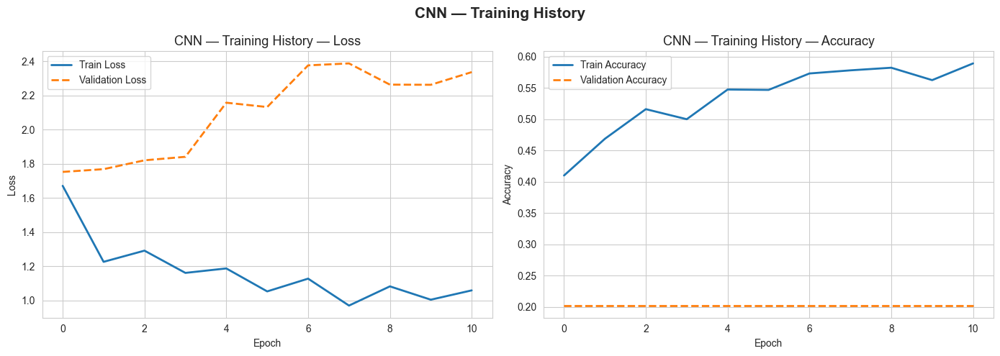

In [22]:
plot_history(cnn_history, title='CNN — Training History')

### 6.1 CNN — Evaluation on Test Set

In [23]:
cnn_test_loss, cnn_test_acc = cnn.evaluate(X_test, y_test, verbose=0)
print(f'CNN — Test Loss    : {cnn_test_loss:.4f}')
print(f'CNN — Test Accuracy: {cnn_test_acc:.4f}')

cnn_preds    = cnn.predict(X_test)
cnn_pred_enc = np.argmax(cnn_preds, axis=1)

print('\n── Classification Report ──────────────────────────────────────────────')
print(classification_report(y_test_enc, cnn_pred_enc,
                             target_names=le.classes_))

CNN — Test Loss    : 1.7544
CNN — Test Accuracy: 0.2021
18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 273ms/step

── Classification Report ──────────────────────────────────────────────
              precision    recall  f1-score   support

       daisy       0.00      0.00      0.00       115
   dandelion       0.20      1.00      0.34       116
        rose       0.00      0.00      0.00       118
   sunflower       0.00      0.00      0.00       110
       tulip       0.00      0.00      0.00       115

    accuracy                           0.20       574
   macro avg       0.04      0.20      0.07       574
weighted avg       0.04      0.20      0.07       574



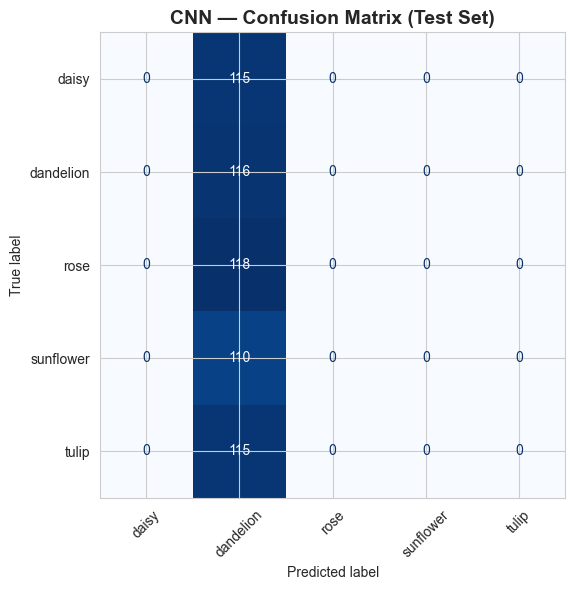

In [24]:
plot_confusion_matrix(y_test_enc, cnn_pred_enc, le.classes_,
                      title='CNN — Confusion Matrix (Test Set)')

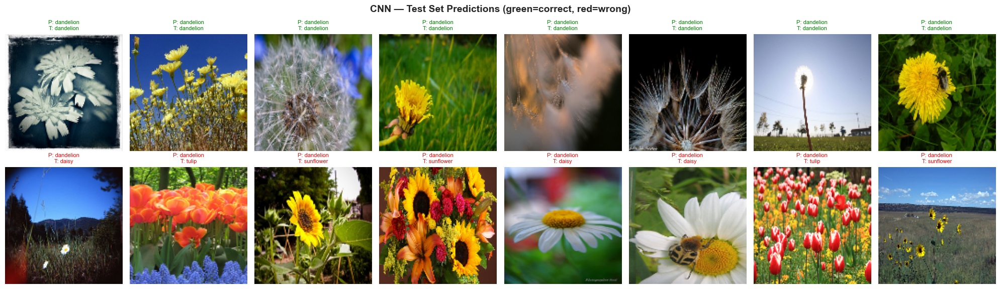

In [25]:
show_predictions(X_test, y_test_enc, cnn_pred_enc, le,
                 title='CNN — Test Set Predictions (green=correct, red=wrong)')

---
<a id="7-transfer"></a>
## 7. Bonus — Transfer Learning with MobileNetV2

**Transfer learning** reuses a model pre-trained on ImageNet (1.4 M images, 1 000 classes) as a feature extractor.  
We freeze the base weights and train only a lightweight classification head — much faster and often more accurate than training from scratch.

### Strategy
1. **Phase 1** — Freeze base, train head only (fast convergence)
2. **Phase 2** — Unfreeze top layers, fine-tune end-to-end with a very low LR

In [26]:
base_model = MobileNetV2(
    input_shape = (IMG_SIZE, IMG_SIZE, 3),
    include_top = False,
    weights     = 'imagenet'
)
base_model.trainable = False          

inputs  = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x       = base_model(inputs, training=False)
x       = GlobalAveragePooling2D()(x)
x       = Dense(256, activation='relu')(x)
x       = BatchNormalization()(x)
x       = Dropout(0.4)(x)
outputs = Dense(len(CLASSES), activation='softmax')(x)

tl_model = Model(inputs, outputs, name='MobileNetV2_TL')
tl_model.compile(optimizer=Adam(learning_rate=1e-3),
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])

print(f'Trainable params (Phase 1): {tl_model.count_params():,}')
tl_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Trainable params (Phase 1): 2,588,229


Model: "MobileNetV2_TL"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_128            │ (None, 4, 4, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 5)              │         1,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,588,229 (9.87 MB)

 Trainable params: 329,733 (1.26 MB)

 Non-trainable params: 2,258,496 (8.62 MB)

In [27]:

tl_callbacks = [
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
    ModelCheckpoint('checkpoints/tl_best.keras', monitor='val_accuracy',
                    save_best_only=True, verbose=0)
]

tl_history_p1 = tl_model.fit(
    datagen.flow(X_train, y_train, batch_size=BATCH),
    steps_per_epoch = X_train.shape[0] // BATCH,
    epochs          = 20,
    validation_data = (X_val, y_val),
    callbacks       = tl_callbacks,
    verbose         = 1
)

Epoch 1/20
41/41 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - accuracy: 0.7079 - loss: 0.9011 - val_accuracy: 0.8188 - val_loss: 0.4954 - learning_rate: 0.0010
Epoch 2/20
41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - accuracy: 0.8750 - loss: 0.5295 - val_accuracy: 0.8275 - val_loss: 0.4861 - learning_rate: 0.0010
Epoch 3/20
41/41 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.8266 - loss: 0.4750 - val_accuracy: 0.8328 - val_loss: 0.4780 - learning_rate: 0.0010
Epoch 4/20
41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.8750 - loss: 0.4656 - val_accuracy: 0.8345 - val_loss: 0.4782 - learning_rate: 0.0010
Epoch 5/20
41/41 ━━━━━━━━━━━━━━━━━━━━ 37s 906ms/step - accuracy: 0.8576 - loss: 0.3889 - val_accuracy: 0.8380 - val_loss: 0.4400 - learning_rate: 0.0010
Epoch 6/20
41/41 ━━━━━━━━━━━━━━━━━━━━ 9s 202ms/step - accuracy: 0.7656 - loss: 0.6771 - val_accuracy: 0.8345 - val_loss: 0.4391 - learning_rate: 0.0010
Epoch 7/20
41/41 ━━━━━━━━━━━━━━━━━━━━ 39s 926ms/step - accuracy: 0.8668 - loss: 0.3644 - va

In [28]:
base_model.trainable = True
fine_tune_from = len(base_model.layers) - 30
for layer in base_model.layers[:fine_tune_from]:
    layer.trainable = False

tl_model.compile(optimizer=Adam(learning_rate=1e-5),   
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])

print(f'Trainable params (Phase 2): {sum(np.prod(v.shape) for v in tl_model.trainable_weights):,}')

tl_history_p2 = tl_model.fit(
    datagen.flow(X_train, y_train, batch_size=BATCH),
    steps_per_epoch = X_train.shape[0] // BATCH,
    epochs          = 30,
    validation_data = (X_val, y_val),
    callbacks       = tl_callbacks,
    verbose         = 1
)

Trainable params (Phase 2): 1,856,133
Epoch 1/30
41/41 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.8032 - loss: 0.5680 - val_accuracy: 0.8484 - val_loss: 0.4231 - learning_rate: 1.0000e-05
Epoch 2/30
41/41 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - accuracy: 0.7656 - loss: 0.6020 - val_accuracy: 0.8484 - val_loss: 0.4233 - learning_rate: 1.0000e-05
Epoch 3/30
41/41 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.8193 - loss: 0.4915 - val_accuracy: 0.8554 - val_loss: 0.4271 - learning_rate: 1.0000e-05
Epoch 4/30
41/41 ━━━━━━━━━━━━━━━━━━━━ 15s 356ms/step - accuracy: 0.8594 - loss: 0.3968 - val_accuracy: 0.8554 - val_loss: 0.4270 - learning_rate: 1.0000e-05
Epoch 5/30
41/41 ━━━━━━━━━━━━━━━━━━━━ 0s 959ms/step - accuracy: 0.8495 - loss: 0.4279
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.
41/41 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.8465 - loss: 0.4408 - val_accuracy: 0.8571 - val_loss: 0.4296 - learning_rate: 1.0000e-05
Epoch 6/30
41/41 ━━━━━━━━━━━━━━━━━━━

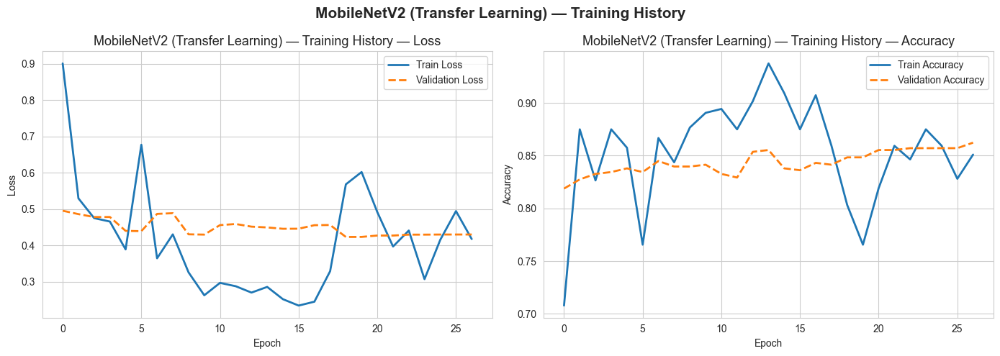

In [29]:
class MergedHistory:
    def __init__(self, h1, h2):
        self.history = {
            k: h1.history[k] + h2.history[k]
            for k in h1.history
        }

tl_history = MergedHistory(tl_history_p1, tl_history_p2)
plot_history(tl_history, title='MobileNetV2 (Transfer Learning) — Training History')

### 7.1 Transfer Learning — Evaluation on Test Set

In [30]:
tl_test_loss, tl_test_acc = tl_model.evaluate(X_test, y_test, verbose=0)
print(f'TL — Test Loss    : {tl_test_loss:.4f}')
print(f'TL — Test Accuracy: {tl_test_acc:.4f}')

tl_preds    = tl_model.predict(X_test)
tl_pred_enc = np.argmax(tl_preds, axis=1)

print('\n── Classification Report ──────────────────────────────────────────────')
print(classification_report(y_test_enc, tl_pred_enc, target_names=le.classes_))

TL — Test Loss    : 0.4570
TL — Test Accuracy: 0.8415
18/18 ━━━━━━━━━━━━━━━━━━━━ 13s 632ms/step

── Classification Report ──────────────────────────────────────────────
              precision    recall  f1-score   support

       daisy       0.82      0.83      0.82       115
   dandelion       0.84      0.87      0.86       116
        rose       0.79      0.87      0.83       118
   sunflower       0.89      0.85      0.87       110
       tulip       0.89      0.79      0.84       115

    accuracy                           0.84       574
   macro avg       0.84      0.84      0.84       574
weighted avg       0.84      0.84      0.84       574



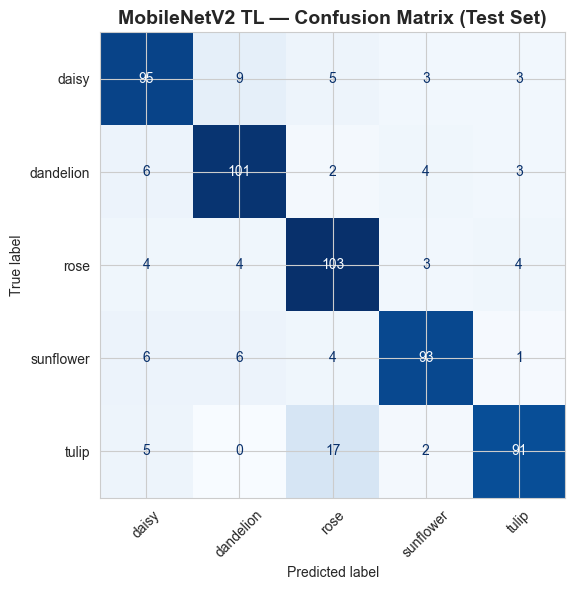

In [31]:
plot_confusion_matrix(y_test_enc, tl_pred_enc, le.classes_,
                      title='MobileNetV2 TL — Confusion Matrix (Test Set)')

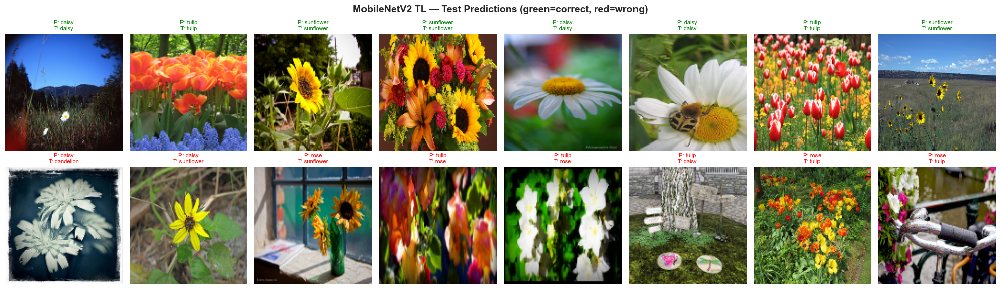

In [32]:
show_predictions(X_test, y_test_enc, tl_pred_enc, le,
                 title='MobileNetV2 TL — Test Predictions (green=correct, red=wrong)')

---
<a id="8-comparison"></a>
## 8. Model Comparison

Side-by-side summary of all three models evaluated on the **held-out test set**.

In [33]:
from sklearn.metrics import f1_score, precision_score, recall_score

results = []
for name, y_pred in [('DNN', dnn_pred_enc),
                     ('CNN', cnn_pred_enc),
                     ('MobileNetV2 TL', tl_pred_enc)]:
    results.append({
        'Model'    : name,
        'Accuracy' : round((y_pred == y_test_enc).mean(), 4),
        'Precision': round(precision_score(y_test_enc, y_pred, average='weighted'), 4),
        'Recall'   : round(recall_score(y_test_enc, y_pred, average='weighted'),    4),
        'F1-Score' : round(f1_score(y_test_enc, y_pred, average='weighted'),        4),
    })

results_df = pd.DataFrame(results).set_index('Model')
print(results_df.to_string())

                Accuracy  Precision  Recall  F1-Score
Model                                                
DNN               0.4530     0.4658  0.4530    0.4472
CNN               0.2021     0.0408  0.2021    0.0679
MobileNetV2 TL    0.8415     0.8443  0.8415    0.8417


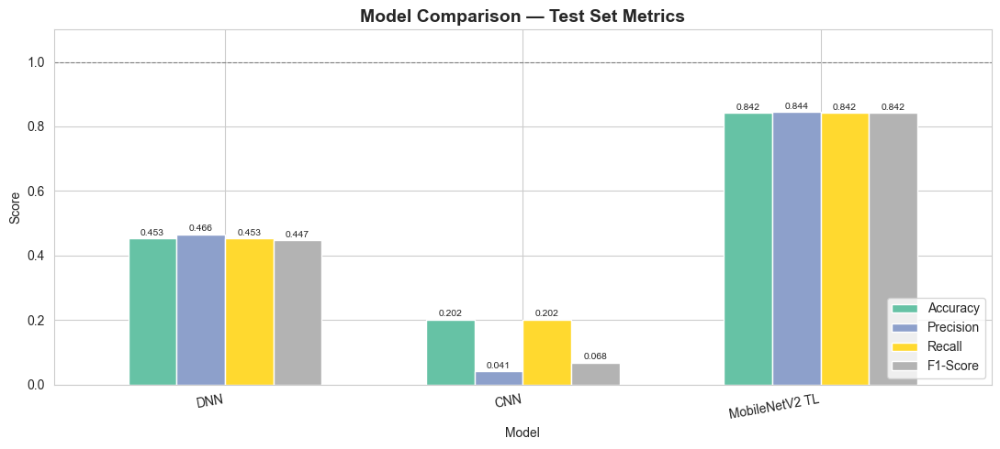

In [34]:
fig, ax = plt.subplots(figsize=(11, 5))
results_df.plot(kind='bar', ax=ax, colormap='Set2', edgecolor='white',
                width=0.65)
ax.set_ylim(0, 1.1)
ax.set_xticklabels(results_df.index, rotation=10, ha='right')
ax.set_ylabel('Score')
ax.set_title('Model Comparison — Test Set Metrics', fontsize=14, fontweight='bold')
ax.legend(loc='lower right')
ax.axhline(1.0, color='grey', linestyle='--', lw=0.8)

# Annotate accuracy bars
for p in ax.patches:
    if p.get_height() > 0.01:
        ax.annotate(f'{p.get_height():.3f}',
                    (p.get_x() + p.get_width() / 2., p.get_height() + 0.01),
                    ha='center', fontsize=7.5)

plt.tight_layout()
plt.show()

---
## 📝 Conclusions

| Model | Key Takeaway |
|---|---|
| **DNN** | Struggles with raw pixels — no spatial inductive bias. Useful baseline. |
| **CNN** | Significantly better; learns hierarchical spatial features. |
| **MobileNetV2 (TL)** | Best accuracy with fewest epochs. Pre-trained weights = powerful head start. |

**Key lessons:**
- Data augmentation reduces overfitting noticeably in the CNN.
- Callbacks (`EarlyStopping`, `ReduceLROnPlateau`) stabilise training and save compute.
- Transfer learning is the practical choice when labelled data is limited.
- A three-way split (train / val / test) gives an honest, unbiased final metric.

---
